# Aprendizaje de Máquina sobre el Impacto del Cambio en el Uso del Suelo sobre la Biodiversidad y el Bienestar
### Daniel Acosta Imandt 
### Gabriel Ernesto Garcia Peña

Estamos interesados en analizar el cambio de la temperatura a lo largo del tiempo y de regiones geográficas, por lo que se esta haciendo una pequeña investigación sobre estos temas, los datos fueron recopilados de The Berkeley Earth temperature reconstruction, el cual tiene la temperatura de varios puntos de la tierra desde  finales del siglo XIX

Cargamos las librerías

In [1]:
import numpy as np
import xarray as xr
import cf_xarray as cfxr
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cartopy.feature as cfeature
from scipy.interpolate import griddata
import regionmask
import pandas as pd
import seaborn as sns
from pydmd import DMD, BOPDMD
from pydmd.plotter import plot_eigs, plot_summary
from pydmd.preprocessing import hankel_preprocessing
from sklearn.preprocessing import StandardScaler
import math
import geopandas as gpd
from shapely.geometry import Point
from shapely.geometry import Polygon
from scipy.spatial import distance_matrix

# Preprocesamiento

abrimos los datos y hacemos transformaciones de su estructura para onvertirlos a un df

In [2]:

fN = ("Datos\Land_and_Ocean_EqualArea.nc") 

ds = xr.open_dataset(fN)
years_approx = np.floor(ds['time'])
temp = ds['temperature'].groupby(years_approx).mean('time')
ds

<xarray.Dataset> Size: 135MB
Dimensions:      (map_points: 15984, time: 2089, month_number: 12)
Coordinates:
    longitude    (map_points) float32 64kB ...
    latitude     (map_points) float32 64kB ...
  * time         (time) float64 17kB 1.85e+03 1.85e+03 ... 2.024e+03 2.024e+03
Dimensions without coordinates: map_points, month_number
Data variables:
    land_mask    (map_points) float64 128kB ...
    temperature  (time, map_points) float32 134MB ...
    climatology  (month_number, map_points) float32 767kB ...
Attributes:
    Conventions:           Berkeley Earth Internal Convention (based on CF-1.5)
    title:                 Native Format Berkeley Earth Surface Temperature A...
    history:               20-Feb-2024 09:56:45
    institution:           Berkeley Earth Surface Temperature Project
    land_source_history:   07-Feb-2024 05:19:02
    ocean_source_history:  20-Feb-2024 08:20:00
    comment:               This file contains Berkeley Earth surface temperat...

Tenemos tres coordenadas distintas,dos geográficas(latitud y longitud) y una temporal, las geograficas generan en total una cantidad de 15984 puntos distribuidos alrededor de la Tierra, mientras la temporal tiene fechas desde 1850 hasta 2024, generando en total 2089 epocas.  Las variables de los datos son 
- land_mask: indica si el punto geográfico pertenece a parte de suelo firme o de mar
- Temperature: marca la temperatura en grados celiusus del punto
- Climatology: Air Surface Temperature Climatology (Jan 1951 - Dec 1980)

In [3]:
temp

<xarray.DataArray 'temperature' (time: 175, map_points: 15984)> Size: 11MB
array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       ...,
       [ 1.8083988 ,  1.8333877 ,  1.9705673 , ...,  1.0385882 ,
         0.84548855,  0.9165156 ],
       [ 2.7273686 ,  2.6766558 ,  2.6351082 , ...,  1.1112143 ,
         1.3121489 ,  1.0617033 ],
       [ 2.2762094 ,  2.031323  ,  2.123713  , ..., -1.9515219 ,
        -2.2443862 , -2.2738068 ]], dtype=float32)
Coordinates:
    longitude  (map_points) float32 64kB ...
    latitude   (map_points) float32 64kB ...
  * time       (time) float64 1kB 1.85e+03 1.851e+03 ... 2.023e+03 2.024e+03
Dimensions without coordinates: map_points
Attributes:
    units:          degree C
    standard_name:  surface_temperature_anomaly
    long_name:      Air Surface Temperature Anomaly
    valid_min:      -17.581396970370164
    valid_max:      23.203125874201458

In [4]:
longitude = ds.variables['longitude'][:]  
latitude = ds.variables['latitude'][:]
time = ds.variables['time'][:]
land_mask = ds.variables['land_mask'][:]
temperature = ds.variables['temperature'][:]
climatology = ds.variables['climatology'][:]

In [5]:

# Convertir los datos de temperatura a un DataFrame
temperature_df = pd.read_csv("Datos/temperatura.csv",index_col="time")

# Revisar el resultado para asegurarse de que tiene el formato correcto
temperature_df.head()


,point_1,point_2,point_3,point_4,point_5,point_6,point_7,point_8,point_9,point_10,...,point_15975,point_15976,point_15977,point_15978,point_15979,point_15980,point_15981,point_15982,point_15983,point_15984
time,,,,,,,,,,,,,,,,,,,,,
1850.041667,NaN,NaN,NaN,NaN,NaN,NaN,0.464756,0.681552,0.785687,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850.125000,NaN,NaN,NaN,NaN,NaN,NaN,-1.490464,-1.236933,-0.806517,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850.208333,NaN,NaN,NaN,NaN,NaN,NaN,-0.157294,-0.230608,-0.166150,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850.291667,NaN,NaN,NaN,NaN,NaN,NaN,-0.139167,-0.058191,-0.072071,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850.375000,NaN,NaN,NaN,NaN,NaN,NaN,-0.878162,-0.964870,-1.003502,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
# Contar los valores vacíos (NaN) por fila en el DataFrame
nan_counts_per_row = temperature_df.isna().sum(axis=1)

# Mostrar los resultados
nan_counts_per_row

time
1850.041667    4404
1850.125000    4281
1850.208333    4285
1850.291667    3957
1850.375000    4083
               ... 
2023.708333       0
2023.791667       0
2023.875000       0
2023.958333       0
2024.041667       0
Length: 2089, dtype: int64

In [7]:
# Define las regiones AR6 utilizando regionmask
regions_ar6 = regionmask.defined_regions.ar6.all
temp_regions=pd.read_csv("Datos/temperaturaregionesipcc.csv",index_col="time")
temp_regions.head()

,Region 0,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,...,Region 48,Region 49,Region 50,Region 51,Region 52,Region 53,Region 54,Region 55,Region 56,Region 57
time,,,,,,,,,,,,,,,,,,,,,
1850.041667,0.136235,-1.330789,0.008371,-1.081719,1.557231,1.357871,0.177940,0.005466,-0.013133,-0.725280,...,-0.754152,0.052812,-0.122649,-0.443389,-0.459247,-0.106958,-0.059162,-0.013802,-0.037105,-0.228845
1850.125000,-2.766186,0.903567,0.457267,-1.672187,-0.238511,0.841829,-0.398261,0.037664,-0.005968,-0.345103,...,-0.929530,0.314541,-0.209424,-0.341581,-1.092278,-0.146366,0.671129,0.367911,0.032516,-0.330520
1850.208333,-0.290138,-1.243747,-0.128986,-2.131074,-1.220055,-0.509307,-0.421122,0.153145,-0.047957,-0.186628,...,-0.766979,-0.177736,-0.228850,-0.490354,-0.456664,-0.462185,-0.215787,-0.304528,-0.054666,0.138855
1850.291667,0.248451,-1.428141,-1.840282,-0.240155,-3.188819,-1.529099,-0.744390,-0.017132,-0.094589,-0.157292,...,-0.403917,-0.471322,-0.146334,-0.470825,-0.542606,-0.543796,-0.349228,-0.271987,-0.158646,0.081552
1850.375000,0.256227,-1.246234,-1.437419,-0.391208,-1.781213,-1.727687,-1.144015,0.459868,0.275922,-0.132240,...,0.048388,-0.553649,0.094990,-0.382022,-0.085905,-0.260265,-0.337365,-0.180721,-0.149693,-0.609608


# Visualización

Convertimos los datos de la temperatura a un Dataframe para poder manipularlo de una manera mas sencilla. Notamos que hay varios valores vacios, sobretodo en las primeras mediciones ya que no son tan seguros los datos de lso primeros años.

Vemos las 57 regiones divididas del planeta y agrupamos los puntos del mapa para ada región

<GeoAxesSubplot: >

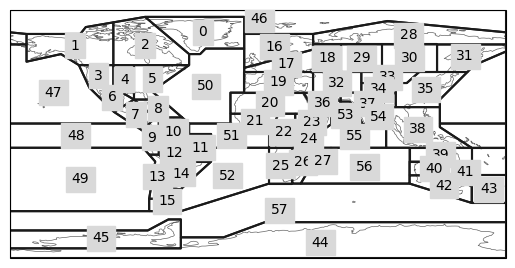

In [8]:
# Define las regiones AR6
ar6_regions = regionmask.defined_regions.ar6.all

# Crea una máscara de regiones para cada punto de la grilla
region_mask = ar6_regions.mask(ds.longitude, ds.latitude, wrap_lon=True)

ar6_all = regionmask.defined_regions.ar6.all
ar6_all.plot()

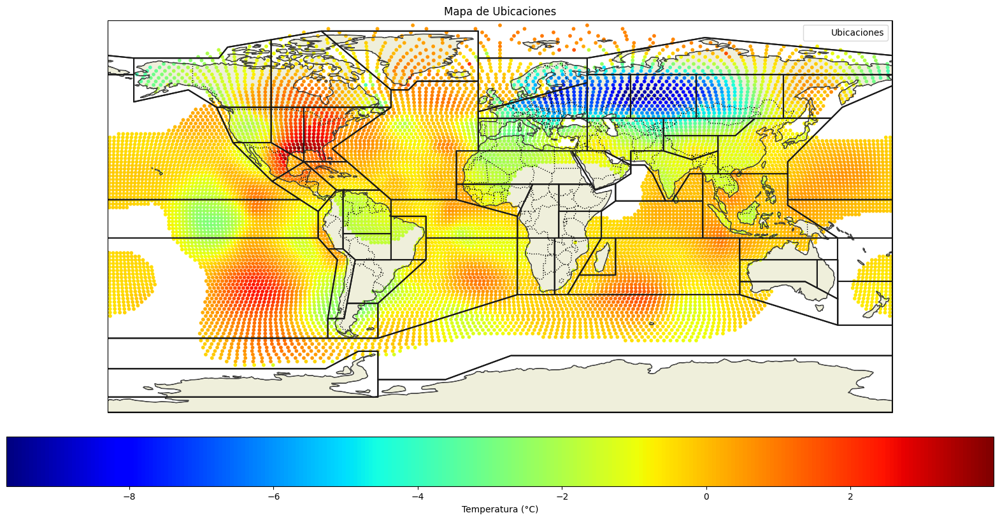

In [9]:
# Crear una figura y un subplot con proyección
fig, ax = plt.subplots(figsize=(20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_global()

# Añadir características al mapa
ax.add_feature(cfeature.LAND)
#ax.add_feature(cfeature.OCEANS)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Añadir los puntos de datos al mapa
scatter =ax.scatter(longitude, latitude,  c=temperature[0], cmap='jet', s=10, transform=ccrs.Geodetic(), label='Ubicaciones')
cbar = plt.colorbar(scatter, ax=ax, orientation='horizontal', pad=0.05)
cbar.set_label('Temperatura (°C)')

ar6_all.plot(ax=ax, add_label=False)
# Añadir leyenda y título
ax.legend()
ax.set_title('Mapa de Ubicaciones')

plt.show()


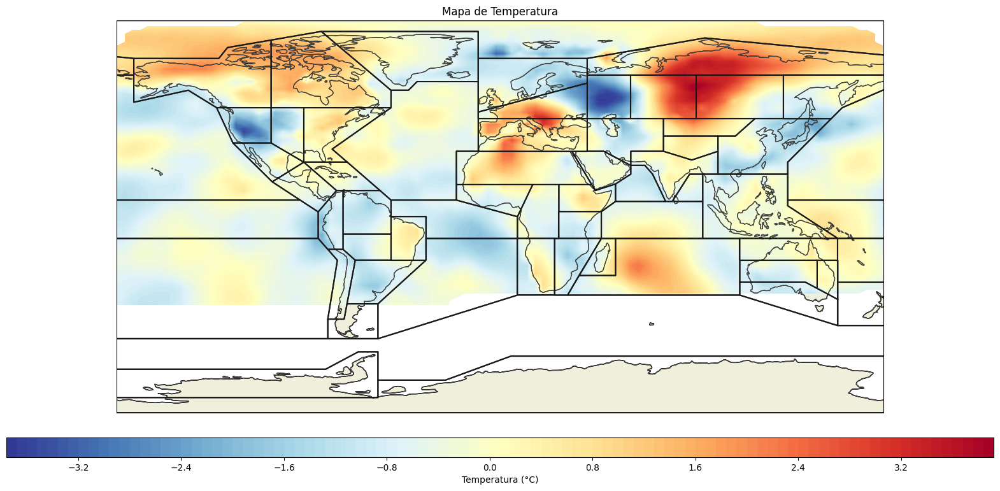

In [10]:

# Definir los límites de la malla sobre la que se interpolan los datos
grid_lon = np.linspace(ds['longitude'].min(), ds['longitude'].max(), 100)
grid_lat = np.linspace(ds['latitude'].min(), ds['latitude'].max(), 100)

# Crear malla de coordenadas
lon, lat = np.meshgrid(grid_lon, grid_lat)

# Interpolar los datos de temperatura sobre la malla
grid_temp = griddata((ds['longitude'], ds['latitude']), temperature[700], (lon, lat), method='cubic')

# Crear figura y eje con proyección de Cartopy
fig, ax = plt.subplots(figsize=(20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent([ds['longitude'].min() - 5, ds['longitude'].max() + 5, ds['latitude'].min() - 5, ds['latitude'].max() + 5], crs=ccrs.PlateCarree())

# Añadir características del mapa
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ar6_all.plot(ax=ax, add_label=False)
# Visualizar la malla de temperatura
contour = ax.contourf(lon, lat, grid_temp, levels=100, cmap='RdYlBu_r', transform=ccrs.PlateCarree())

# Añadir barra de color
cbar = plt.colorbar(contour, ax=ax, orientation='horizontal', pad=0.05, aspect=50)
cbar.set_label('Temperatura (°C)')

# Añadir título
ax.set_title('Mapa de Temperatura')

plt.show()


# Series de tiempo 

In [11]:

land_mask_values = ds['land_mask'].values
unique_land_mask_values = np.unique(land_mask_values)
unique_land_mask_values

dates = np.floor(ds['time'])

# Agrupar por estos años aproximados y calcular la media de la temperatura
temp = ds['temperature'].groupby(years_approx).mean('time')


# Separar las temperaturas en tierra y mar basándose en el 'land_mask'
# Considerar cualquier valor de 'land_mask' > 0 como tierra
is_land = land_mask_values > 0

# Temperaturas donde es tierra
temperature_land = ds['temperature'].where(is_land)

# Temperaturas donde es mar (negación de is_land)
temperature_sea = ds['temperature'].where(~is_land)

# Calcular la temperatura media anual para tierra y mar
annual_mean_temperature_land = temperature_land.groupby(dates).mean(dim=['time', 'map_points'])
annual_mean_temperature_sea = temperature_sea.groupby(dates).mean(dim=['time', 'map_points'])
# Calcular la desviación anual para tierra y mar
annual_std_temperature_land = temperature_land.groupby(dates).std(dim=['time', 'map_points'])
annual_std_temperature_sea = temperature_sea.groupby(dates).std(dim=['time', 'map_points'])
# Calcular la var anual para tierra y mar
annual_var_temperature_land = temperature_land.groupby(dates).var(dim=['time', 'map_points'])
annual_var_temperature_sea = temperature_sea.groupby(dates).var(dim=['time', 'map_points'])
annual_mean_temperature_land, annual_mean_temperature_sea


(<xarray.DataArray 'temperature' (time: 175)> Size: 700B
 array([-0.6116513 , -0.39715376, -0.47131598, -0.46754357, -0.34948713,
        -0.4413031 , -0.47487193, -0.7085741 , -0.42646918, -0.22443046,
        -0.56777054, -0.64176524, -0.9526564 , -0.35228318, -0.54712564,
        -0.35908064, -0.30264416, -0.19803175, -0.3843545 , -0.17906176,
        -0.3883681 , -0.4960546 , -0.3950557 , -0.2930972 , -0.19983791,
        -0.5749346 , -0.4199104 , -0.03559515,  0.28798628, -0.32406768,
        -0.4399538 , -0.23830725, -0.3737743 , -0.46876946, -0.66265595,
        -0.5442405 , -0.52421963, -0.5807033 , -0.38082722, -0.17662732,
        -0.52965444, -0.46818283, -0.45980513, -0.44748312, -0.35957053,
        -0.337237  , -0.28654888, -0.18221706, -0.36105296, -0.1542841 ,
        -0.00983609, -0.0572198 , -0.31903154, -0.3496894 , -0.47634688,
        -0.332733  , -0.1995229 , -0.5578545 , -0.39380157, -0.39708263,
        -0.37141582, -0.41177544, -0.41592464, -0.3353899 , -0.0640

In [12]:

temperature_mean = temperature_df.mean(axis=1)
# Calcular la media móvil de 12 años y la desviación estándar móvil
moving_average = temperature_mean.rolling(window=12).mean()
moving_std = temperature_mean.std()

# Calcular el intervalo de confianza del 95% para la media móvil
confidence_interval_upper = moving_average + 1.96 * moving_std / np.sqrt(12)
confidence_interval_lower = moving_average - 1.96 * moving_std / np.sqrt(12)

# Crear la gráfica base con la temperatura media
fig = go.Figure()

# Añadir la media móvil de 12 años
fig.add_trace(go.Scatter(x=temperature_mean.index, y=moving_average, mode='lines', name='Media Móvil 12 Años'))

# Añadir el intervalo de confianza como una región sombreada
fig.add_trace(go.Scatter(x=temperature_mean.index.tolist() + temperature_mean.index.tolist()[::-1],
                         y=confidence_interval_upper.tolist() + confidence_interval_lower.tolist()[::-1],
                         fill='toself', fillcolor='rgba(0,100,80,0.2)',
                         line=dict(color='rgba(255,255,255,0)'),
                         name='Intervalo de Confianza 95%'))

# Añadir la serie de temperatura promedio original para referencia
fig.add_trace(go.Scatter(x=temperature_mean.index, y=temperature_mean, mode='lines', name='Temperatura Promedio', line=dict(color='gray', dash='dash')))

# Actualizar el layout de la gráfica
fig.update_layout(title='Temperatura Promedio y Media Móvil de 12 Años con Intervalo de Confianza',
                  xaxis_title='Tiempo', yaxis_title='Temperatura Promedio (°C)',
                  legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))

# Mostrar la gráfica
fig.show()


C:\Users\danie\AppData\Local\Temp\ipykernel_32892\3465029024.py:27: MatplotlibDeprecationWarning:

The 'use_line_collection' parameter of stem() was deprecated in Matplotlib 3.6 and will be removed two minor releases later. If any parameter follows 'use_line_collection', they should be passed as keyword, not positionally.



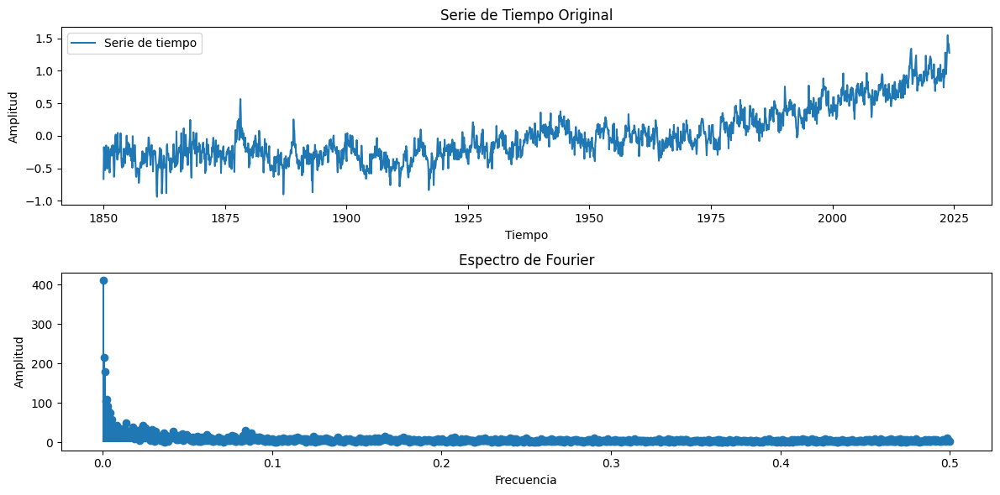

In [13]:

# Calcular la Transformada de Fourier Discreta
fourier_transform = np.fft.fft(temperature_mean)
frequencies = np.fft.fftfreq(len(temperature_mean), d=1)

# Obtener las amplitudes y filtrar frecuencias positivas
amplitudes = np.abs(fourier_transform)
positive_frequencies = frequencies > 0

# Graficar la serie de tiempo original
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot( temperature_mean, label="Serie de tiempo")
plt.title("Serie de Tiempo Original")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.legend()

# Graficar el espectro de Fourier
plt.subplot(2, 1, 2)
plt.stem(frequencies[positive_frequencies], amplitudes[positive_frequencies], basefmt=" ", use_line_collection=True)
plt.title("Espectro de Fourier")
plt.xlabel("Frecuencia")
plt.ylabel("Amplitud")
plt.tight_layout()
plt.show()


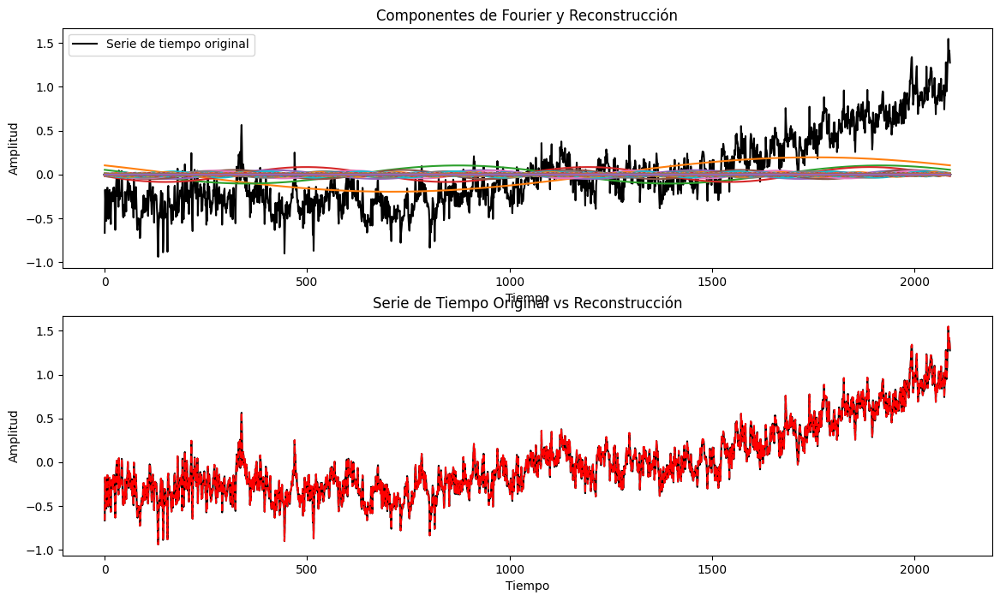

In [14]:
t = np.arange(len(temperature_mean))

# Calcular la Transformada de Fourier Discreta
fourier_transform = np.fft.fft(temperature_mean)
n = temperature_mean.size
frequencies = np.fft.fftfreq(n, d=1)  # Asumiendo que el paso de tiempo entre datos es 1

# Preparar la reconstrucción de la serie de tiempo a partir de los componentes de Fourier
reconstruccion = np.zeros_like(temperature_mean)

# Graficar la serie de tiempo original
plt.figure(figsize=(14, 8))
plt.subplot(2, 1, 1)
plt.plot(t, temperature_mean, label="Serie de tiempo original", color='black')
plt.title("Componentes de Fourier y Reconstrucción")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.legend()

# Graficar cada componente y sumar para la reconstrucción
for idx, freq in enumerate(frequencies):
    if idx <= n // 2 and np.abs(fourier_transform[idx]) > 1e-10:  # Filtrar componentes irrelevantes
        amplitude = np.abs(fourier_transform[idx]) / n
        phase = np.angle(fourier_transform[idx])
        componente = amplitude * np.cos(2 * np.pi * freq * t + phase)
        reconstruccion += componente * 2  # Sumar el doble de cada componente porque la mitad va para frecuencias negativas
        plt.plot(t, componente)  # Etiquetar solo algunos para evitar saturación

plt.legend()

# Graficar la reconstrucción
plt.subplot(2, 1, 2)
plt.plot(t, temperature_mean, label="Serie de tiempo original", color='black')
plt.plot(t, reconstruccion, label="Reconstrucción", linestyle='--', color='red')
plt.title("Serie de Tiempo Original vs Reconstrucción")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
#plt.legend()
#plt.tight_layout()
plt.show()


C:\Users\danie\AppData\Local\Temp\ipykernel_32892\883929438.py:22: UserWarning:

Attempt to set non-positive xlim on a log-scaled axis will be ignored.



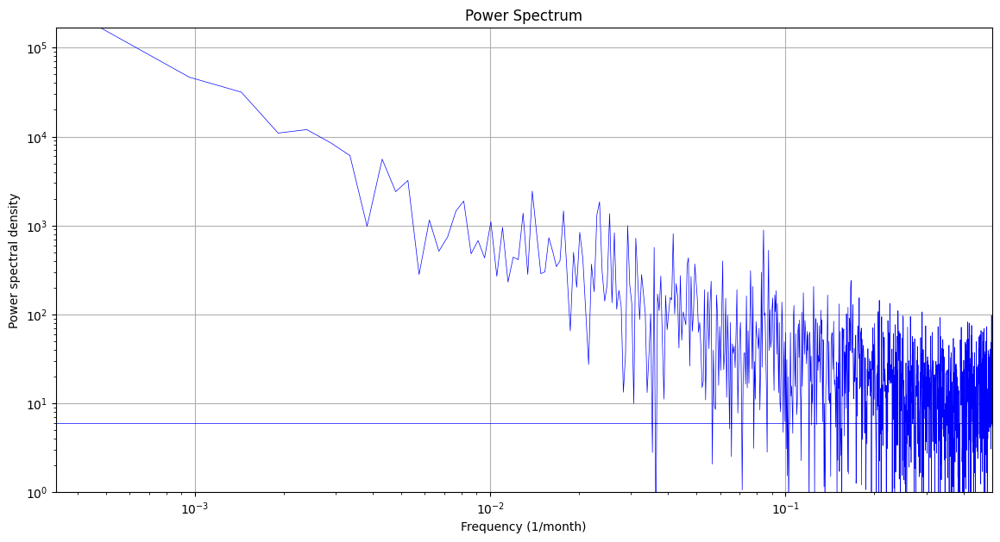

In [16]:
# Calcular la transformada rápida de Fourier (FFT) y las frecuencias
fft_result = np.fft.fft(temperature_mean)
frequencies = np.fft.fftfreq(len(temperature_mean), d=1)  # Asume que los datos son mensuales

# Calcular el espectro de potencia (magnitud al cuadrado)
power_spectrum = np.abs(fft_result) ** 2

# Preparar el gráfico en escala log-log
plt.figure(figsize=(14, 7))
plt.loglog(frequencies, power_spectrum, 'b-', linewidth=0.5)  # Línea del espectro

# Resaltar áreas específicas del espectro (necesitarás definir 'mid_scales' y 'short_scales')
#plt.axvline(x=mid_scales, color='red', linestyle='--')
#plt.axvline(x=short_scales, color='black', linestyle='--')

# Agregar anotaciones (necesitarás ajustar las posiciones 'x' y 'y' según tus datos)
#plt.text(x1, y1, 'Seasonal cycle', ha='center', va='center', rotation='vertical')
#plt.text(x2, y2, 'Mid scales', ha='center', va='center', rotation='vertical')
#plt.text(x3, y3, 'Short scales', ha='center', va='center', rotation='vertical')

# Ajustar los límites y etiquetas de los ejes
plt.xlim([frequencies.min(), frequencies.max()])
plt.ylim([1, power_spectrum.max()])
plt.xlabel('Frequency (1/month)')
plt.ylabel('Power spectral density')
plt.title('Power Spectrum')

# Mostrar la grilla
plt.grid(True)

# Mostrar el gráfico
plt.show()


Vemos una serie de tiempo de la temperatura para ada región del planeta

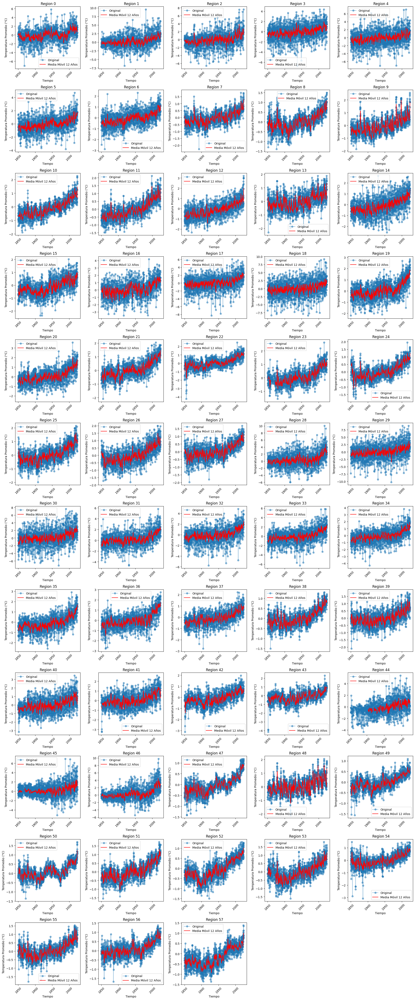

In [18]:
# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de filas necesarias
num_regions = len(temp_regions.columns)
total_rows = math.ceil(num_regions / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))  # Ajusta el tamaño de la figura según necesites

for i, column in enumerate(temp_regions.columns, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    
    # Plotear la serie de tiempo original
    ax.plot(temp_regions.index, temp_regions[column], label='Original', marker='o', linestyle='-', alpha=0.5)
    
    # Calcular y plotear la media móvil de 12 años
    moving_average = temp_regions[column].rolling(window=12).mean()
    ax.plot(temp_regions.index, moving_average, label='Media Móvil 12 Años', color='red', linestyle='-')
    
    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f' {column}')
    ax.set_xlabel('Tiempo')
    ax.set_ylabel('Temperatura Promedio (°C)')
    ax.legend()
    plt.xticks(rotation=45)

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()


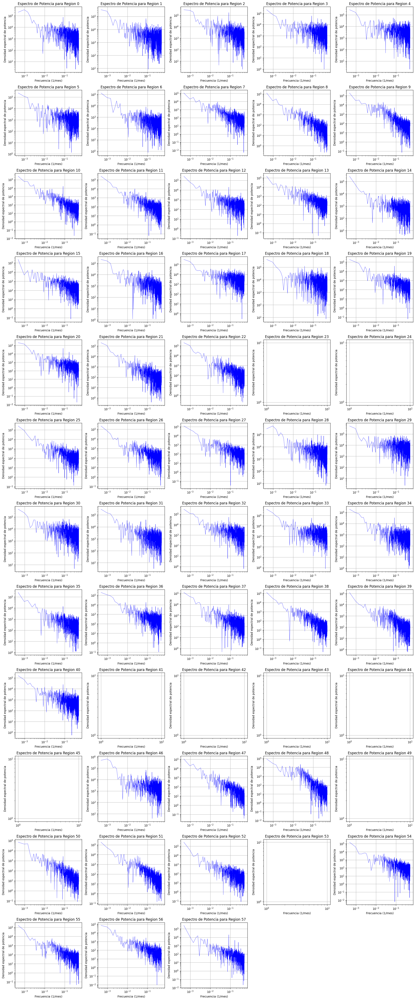

In [17]:


# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de filas necesarias
num_regions = len(temp_regions.columns)
total_rows = math.ceil(num_regions / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))  # Ajusta el tamaño de la figura según necesites

for i, column in enumerate(temp_regions.columns, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    
    # Datos de la región actual
    region_data = temp_regions[column]
    
    # Calcular la transformada rápida de Fourier (FFT) y las frecuencias
    fft_result = np.fft.fft(region_data)
    frequencies = np.fft.fftfreq(len(region_data), d=1)  # Asume que los datos son mensuales
    
    # Calcular el espectro de potencia (magnitud al cuadrado)
    power_spectrum = np.abs(fft_result) ** 2
    
    # Graficar el espectro de potencia en escala log-log
    ax.loglog(frequencies[frequencies > 0], power_spectrum[frequencies > 0], 'b-', linewidth=0.5)  # Filtra solo frecuencias positivas

    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f'Espectro de Potencia para {column}')
    ax.set_xlabel('Frecuencia (1/mes)')
    ax.set_ylabel('Densidad espectral de potencia')
    ax.grid(True)

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()


In [23]:
temp_regions.index

Float64Index([1850.0416666666667,           1850.125, 1850.2083333333333,
              1850.2916666666667,           1850.375, 1850.4583333333333,
              1850.5416666666667,           1850.625, 1850.7083333333333,
              1850.7916666666667,
              ...
              2023.2916666666663,           2023.375, 2023.4583333333333,
              2023.5416666666663,           2023.625, 2023.7083333333333,
              2023.7916666666663,           2023.875, 2023.9583333333333,
              2024.0416666666663],
             dtype='float64', name='time', length=2089)

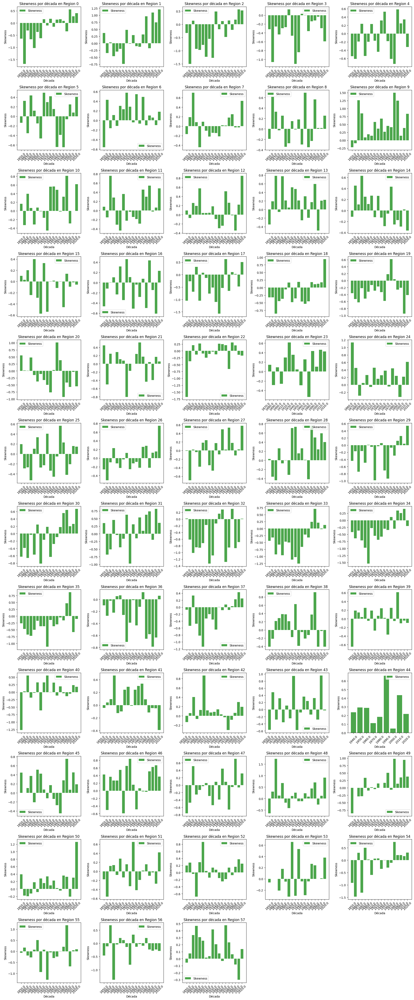

In [24]:

from scipy.stats import skew

# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de filas necesarias
num_regions = len(temp_regions.columns)
total_rows = math.ceil(num_regions / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))  # Ajusta el tamaño de la figura según necesites

# Calcular el skewness para cada década en cada región
for i, column in enumerate(temp_regions.columns, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    
    # Agrupar por década y calcular skewness
    # Suponemos que el índice es un DateTimeIndex, permite agrupar por década
    decades = (temp_regions.index // 10) * 10
    skewness_by_decade = temp_regions[column].groupby(decades).apply(skew)

    # Plotear el skewness por década
    ax.bar(skewness_by_decade.index.astype(str), skewness_by_decade.values, label='Skewness', color='green', alpha=0.7)
    
    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f'Skewness por década en {column}')
    ax.set_xlabel('Década')
    ax.set_ylabel('Skewness')
    ax.legend()
    plt.xticks(rotation=45)  # Puede ser necesario ajustar dependiendo del formato de fecha

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()


[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


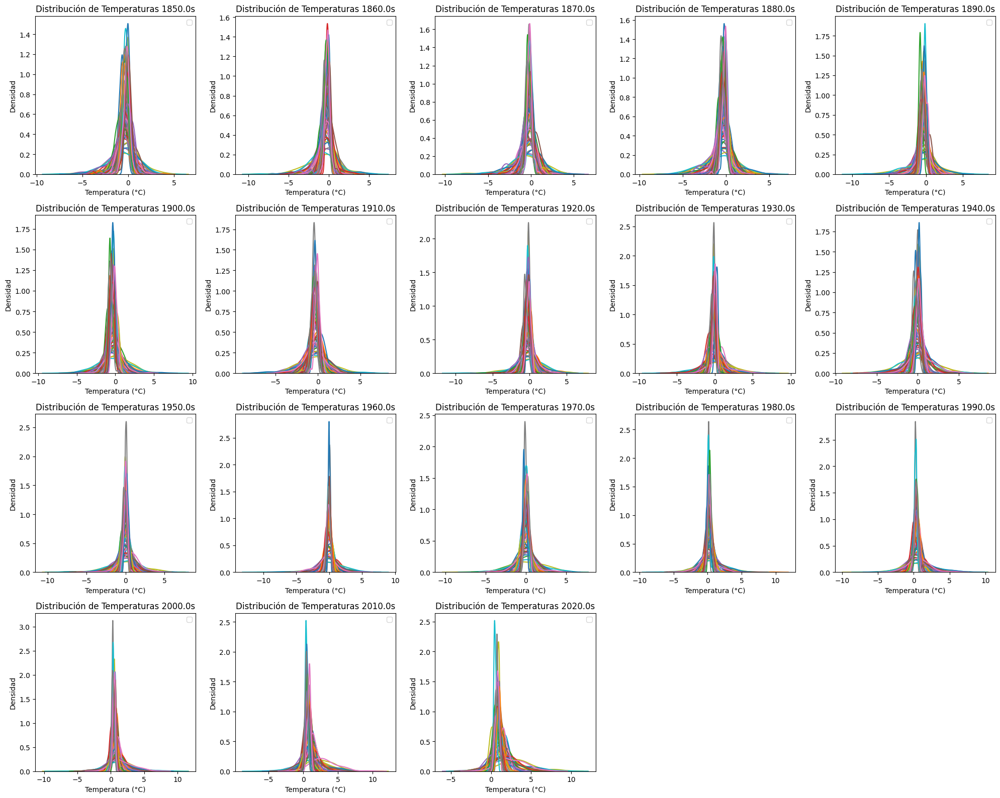

In [26]:

from scipy.stats import skew

# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de filas necesarias para cada década
decades = (temp_regions.index // 10) * 10
unique_decades = np.unique(decades)
total_rows = math.ceil(len(unique_decades) / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))

# Iterar sobre cada década y calcular la asimetría
for i, decade in enumerate(unique_decades, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    # Filtrar los datos para la década actual
    data_decade = temp_regions[decades == decade]
    
    # Podemos usar seaborn para plotear la KDE de todas las regiones juntas
    for column in temp_regions.columns:
        sns.kdeplot(data_decade[column], ax=ax, 
                    #label=f'{column} skew: {skew(data_decade[column].dropna()):.2f}'
                    )
    
    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f'Distribución de Temperaturas {decade}s')
    ax.set_xlabel('Temperatura (°C)')
    ax.set_ylabel('Densidad')
    ax.legend()

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()


# Correlaciones

Vemos la matrix de correlación de cada región con las otras regiones

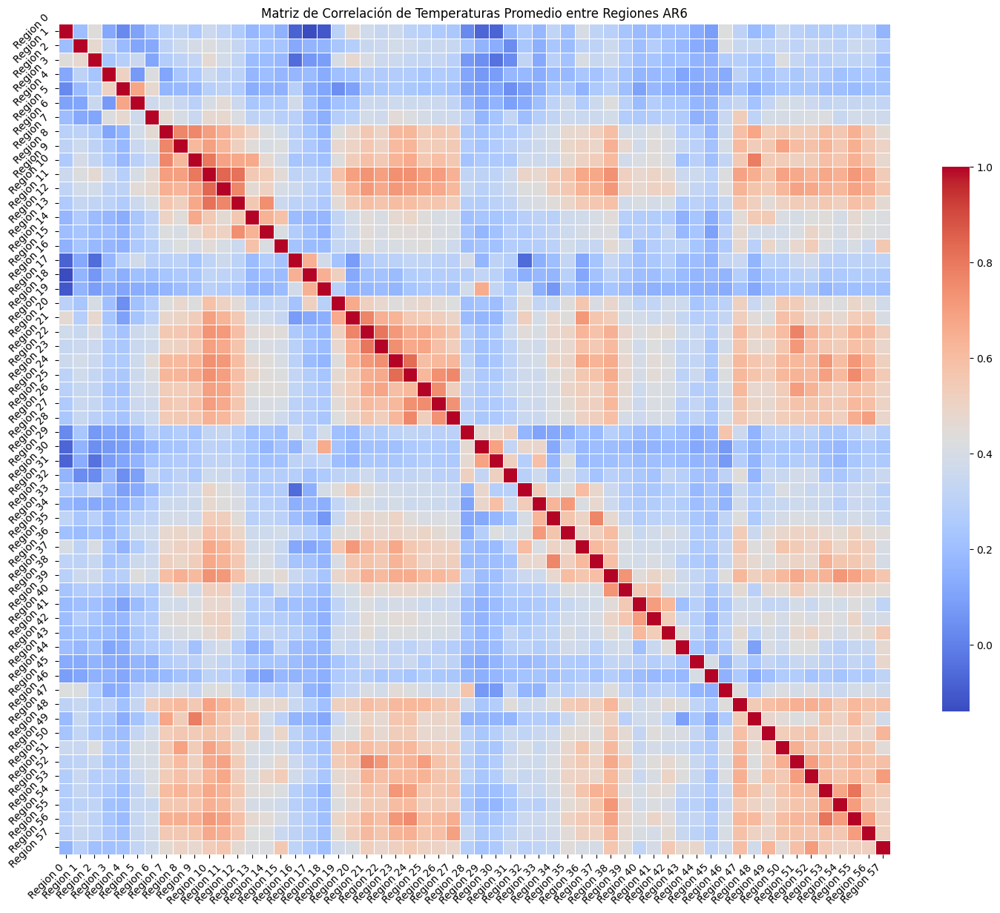

In [ ]:
# Calcular la matriz de correlación
correlation_matrix = temp_regions.corr()


# Usar seaborn para crear un heatmap de la matriz de correlación
plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix, annot=False,  cmap='coolwarm', square=True,
            cbar_kws={'shrink': .5}, linewidths=.5)  
plt.title('Matriz de Correlación de Temperaturas Promedio entre Regiones AR6')
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=45)
plt.tight_layout()  # Ajusta la disposición
plt.show()



region
Greenland/Iceland            [Greenland/Iceland, N.Atlantic-Ocean, Arctic-O...
N.W.North-America            [N.W.North-America, W.North-America, C.North-A...
N.E.North-America            [N.E.North-America, E.North-America, C.North-A...
W.North-America              [W.North-America, N.Central-America, C.North-A...
C.North-America              [C.North-America, N.Central-America, W.North-A...
E.North-America              [E.North-America, C.North-America, Caribbean, ...
N.Central-America            [N.Central-America, C.North-America, W.North-A...
S.Central-America            [S.Central-America, Caribbean, N.W.South-Ameri...
Caribbean                    [Caribbean, S.Central-America, N.South-America...
N.W.South-America            [N.W.South-America, N.South-America, South-Ame...
N.South-America              [N.South-America, Equatorial.Pacific-Ocean, So...
N.E.South-America            [N.E.South-America, Equatorial.Pacific-Ocean, ...
South-American-Monsoon       [South-American-

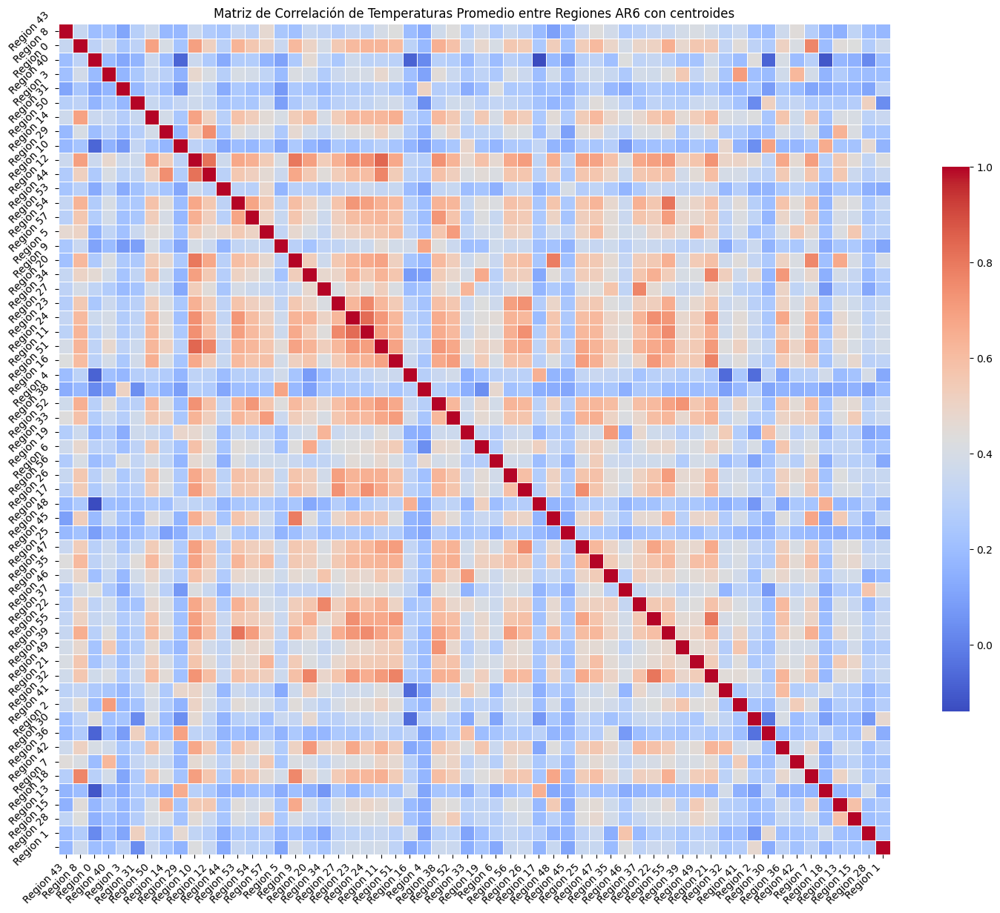

In [ ]:

centroids = [Point(region.polygon.centroid.x, region.polygon.centroid.y) for region in ar6_regions]

# Crea un GeoDataFrame con las coordenadas de los centroides
centroids_df = gpd.GeoDataFrame({'region': [region.name for region in ar6_regions], 'geometry': centroids})

# Extrae las coordenadas x, y para calcular la matriz de distancia
coords = np.array(list(centroids_df.geometry.apply(lambda geom: (geom.x, geom.y))))

# Calcula la matriz de distancias entre centroides
dist_matrix = pd.DataFrame(
    distance_matrix(coords, coords),
    index=centroids_df.region, columns=centroids_df.region)

# Encuentra las regiones más cercanas
closest_regions = dist_matrix.apply(lambda row: row.nsmallest(5).index.tolist(), axis=1)
print(closest_regions)

# Asumiendo que la lista closest_regions está basada en nombres descriptivos
region_to_index = {name: f"Region {i}" for i, name in enumerate(ar6_regions.names)}

# Usando el mapeo para actualizar `new_order` a los nombres correctos
new_order = [region_to_index[region] for region in new_order if region in region_to_index]

# Incluyendo regiones restantes
remaining_regions = set(correlation_matrix.index) - set(new_order)
new_order.extend(list(remaining_regions))

# Reordena la matriz de correlación
reordered_corr_matrix = correlation_matrix.loc[new_order, new_order]

# Usar seaborn para crear un heatmap de la matriz de correlación
plt.figure(figsize=(15, 15))
sns.heatmap(reordered_corr_matrix, annot=False,  cmap='coolwarm', square=True,
            cbar_kws={'shrink': .5}, linewidths=.5)  
plt.title('Matriz de Correlación de Temperaturas Promedio entre Regiones AR6 con centroides')

plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=45)
plt.tight_layout()  # Ajusta la disposición
plt.show()


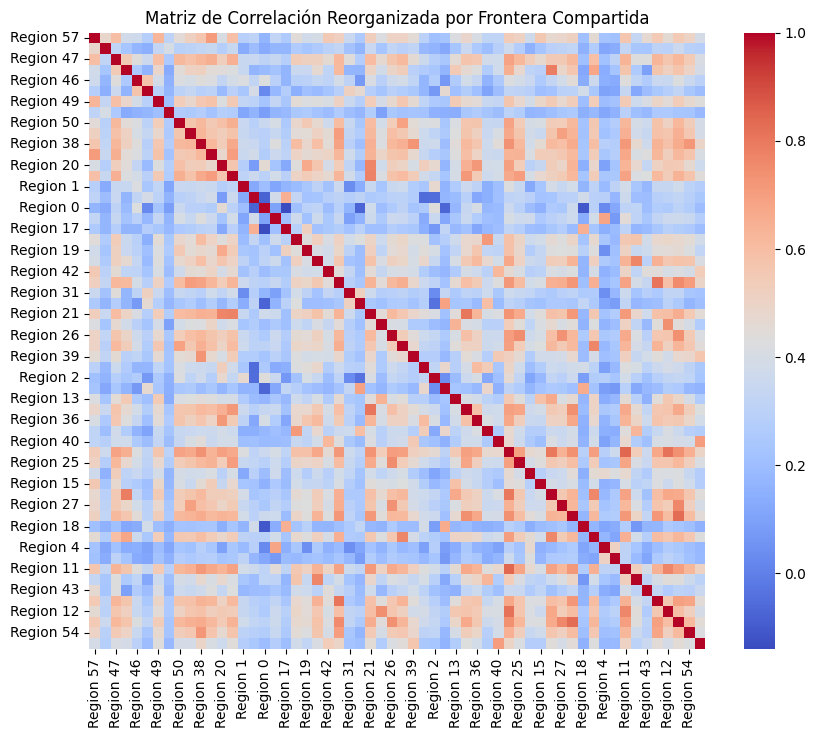

In [ ]:
import geopandas as gpd

import pandas as pd

# Suponiendo que 'ar6_regions' es tu conjunto de regiones de 'regionmask'
regions_polygons = [region.polygon for region in ar6_regions]  # Asegúrate de que cada elemento sea un polígono de Shapely
regions_names = [region.name for region in ar6_regions]

# Crear GeoDataFrame
gdf = gpd.GeoDataFrame({'region': regions_names, 'geometry': regions_polygons})

# Calcular fronteras compartidas
# Inicializar una matriz para guardar las longitudes de fronteras compartidas
border_length_matrix = pd.DataFrame(0, index=regions_names, columns=regions_names)

# Calcular intersecciones
for i, geo1 in enumerate(gdf.geometry):
    for j, geo2 in enumerate(gdf.geometry):
        if i != j:
            # Intersectar los polígonos y calcular la longitud de la línea de intersección
            intersection = geo1.intersection(geo2)
            if intersection.is_empty:
                length = 0
            else:
                length = intersection.length
            border_length_matrix.iloc[i, j] = length

# Reordenar matriz de correlación basada en la frontera compartida
# Esto podría hacerse, por ejemplo, sumando las longitudes y ordenando las regiones por esta suma
border_sum = border_length_matrix.sum()
sorted_regions = border_sum.sort_values(ascending=False).index

# Asumiendo que la lista closest_regions está basada en nombres descriptivos
region_to_index = {name: f"Region {i}" for i, name in enumerate(ar6_regions.names)}

# Aplicar mapeo a sorted_regions
sorted_indices = [region_to_index[name] for name in sorted_regions if name in region_to_index]

# Asegurarse de que todos los índices de la matriz original estén presentes
remaining_indices = set(correlation_matrix.index) - set(sorted_indices)
sorted_indices.extend(list(remaining_indices))
# Suponiendo que 'correlation_matrix' es tu matriz original de correlación
reordered_corr_matrix = correlation_matrix.loc[sorted_indices, sorted_indices]



plt.figure(figsize=(10, 8))
sns.heatmap(reordered_corr_matrix, annot=False, cmap='coolwarm', square=True)
plt.title('Matriz de Correlación Reorganizada por Frontera Compartida')
plt.show()


# DMD

vamos a utilizar DMD para descomponer los datos en distintas frecuencias

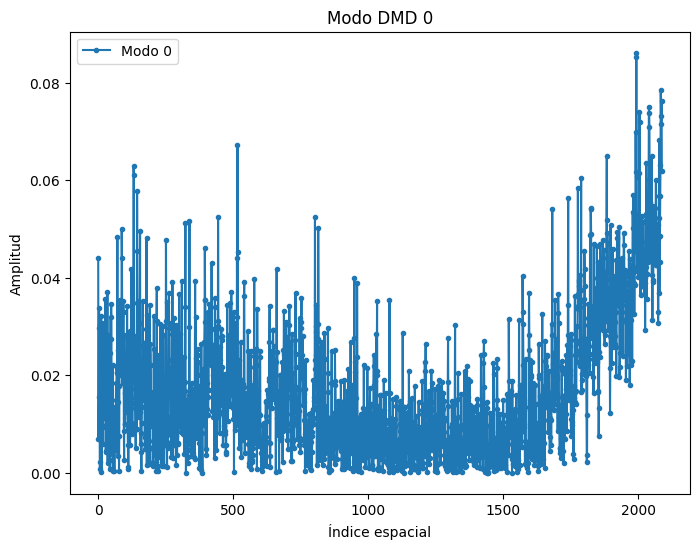

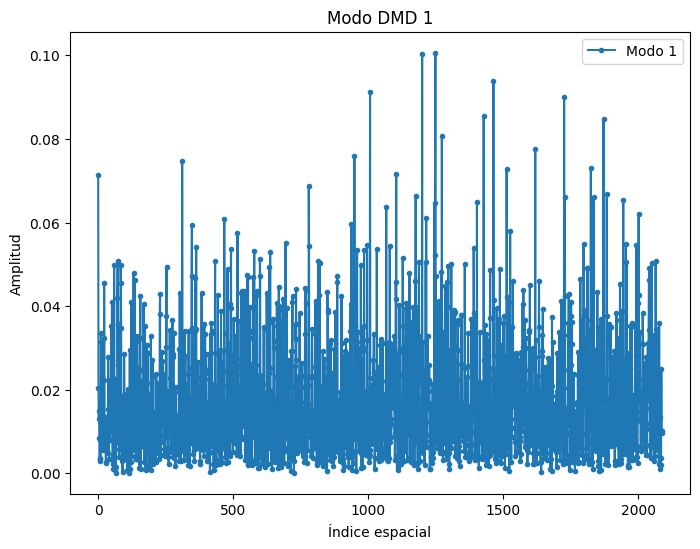

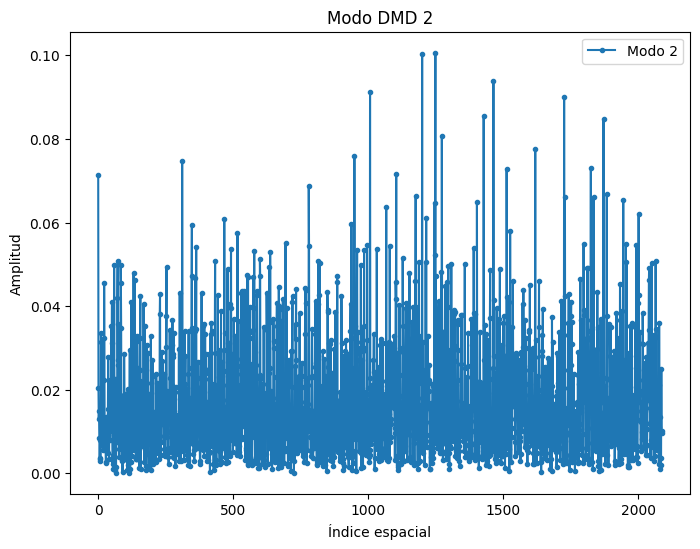

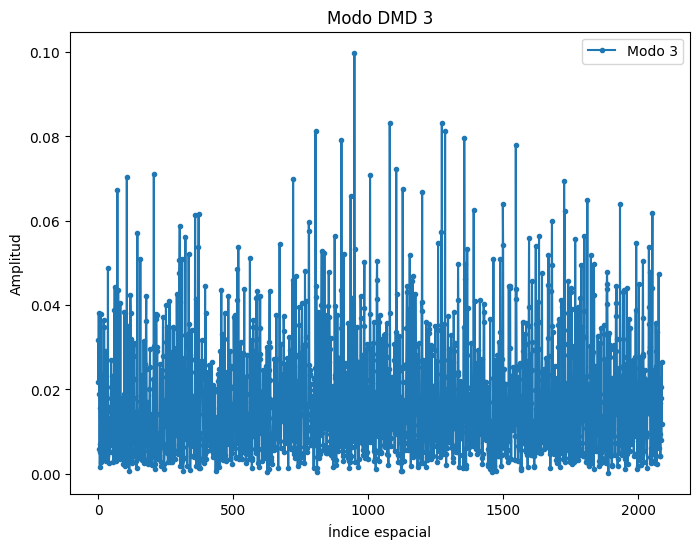

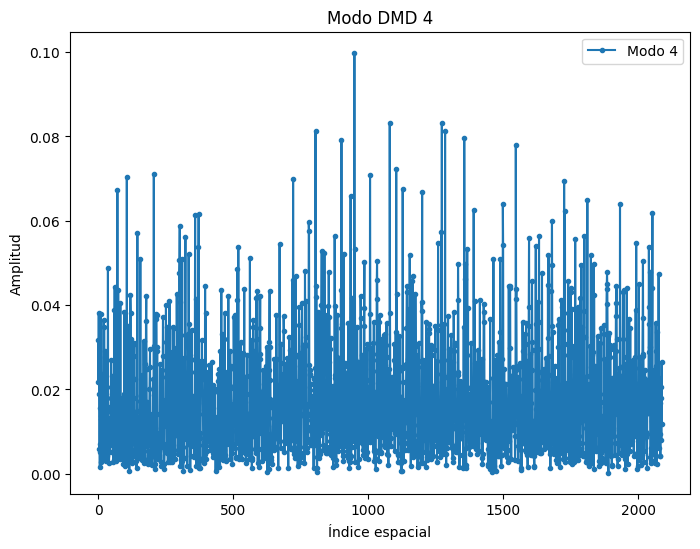

In [ ]:
from pydmd import DMD
temperature_df_clean = temp_regions.fillna(method='ffill').fillna(method='bfill')
X = temperature_df_clean.iloc[:, :-1].values
X_prime = temperature_df_clean.iloc[:, 1:].values
# Convertimos el DataFrame a la matriz necesaria para PyDMD
data_matrix = temperature_df_clean.values

# Dado que PyDMD trabaja con matrices donde cada columna es una instantánea en el tiempo,
# y las filas son las características/observaciones espaciales a lo largo del tiempo,
# asegúrate de que tu data_matrix esté organizada de esta manera.

# Inicializar y ajustar el modelo DMD
dmd = DMD(svd_rank=5)  # Puedes ajustar svd_rank según sea necesario
dmd.fit(data_matrix)

# Plotear los modos DMD
for i, mode in enumerate(dmd.modes.T):
    plt.figure(figsize=(8, 6))
    plt.plot(np.abs(mode), '.-', label=f'Modo {i}')
    plt.title(f'Modo DMD {i}')
    plt.xlabel('Índice espacial')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.show()


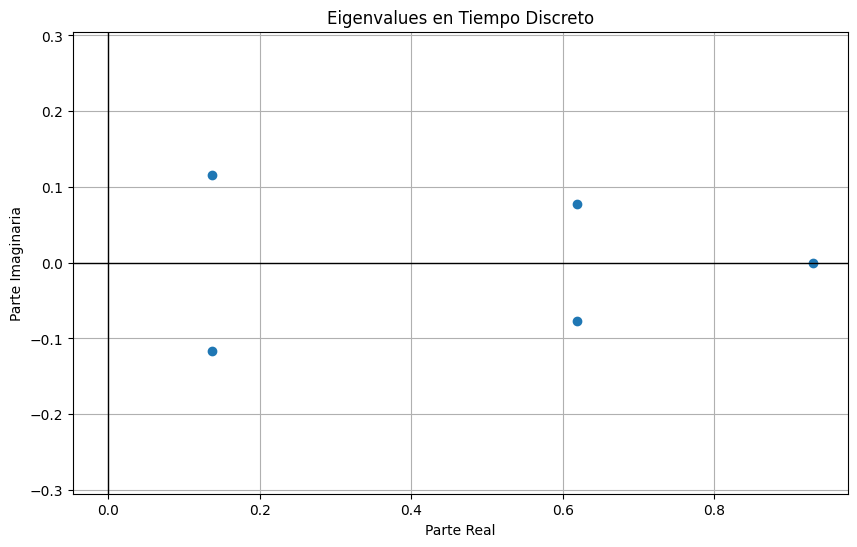

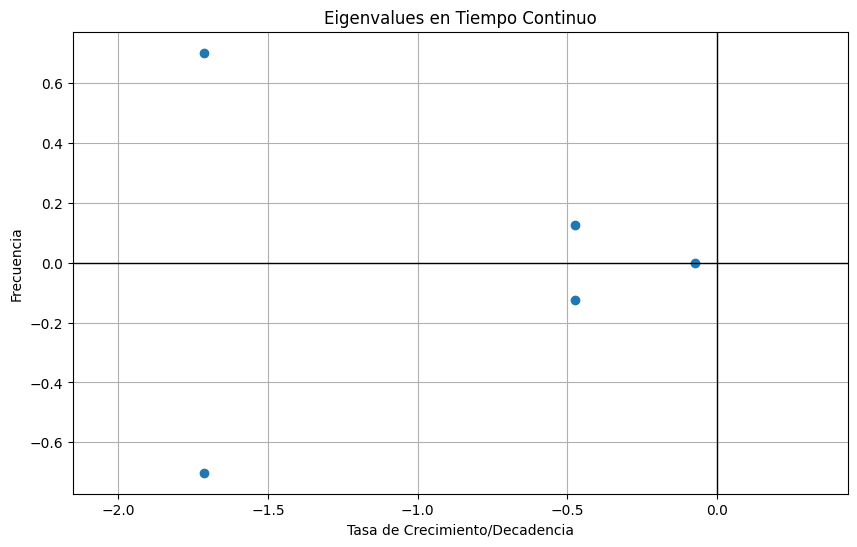

In [ ]:


# Plotear los eigenvalues en tiempo discreto
plt.figure(figsize=(10, 6))
plt.scatter(dmd.eigs.real, dmd.eigs.imag, marker='o')
plt.title('Eigenvalues en Tiempo Discreto')
plt.xlabel('Parte Real')
plt.ylabel('Parte Imaginaria')
plt.axhline(0, color='black', lw=1)
plt.axvline(0, color='black', lw=1)
plt.grid(True)
plt.axis('equal')
plt.show()

# Calcular y plotear los eigenvalues en tiempo continuo
eigs_cont = np.log(dmd.eigs) / dmd.original_time['dt']

plt.figure(figsize=(10, 6))
plt.scatter(eigs_cont.real, eigs_cont.imag, marker='o')
plt.title('Eigenvalues en Tiempo Continuo')
plt.xlabel('Tasa de Crecimiento/Decadencia')
plt.ylabel('Frecuencia')
plt.axhline(0, color='black', lw=1)
plt.axvline(0, color='black', lw=1)
plt.grid(True)
plt.axis('equal')
plt.show()


In [ ]:
# Paso 1: Descomposición en Valores Singulares (SVD) de X
U, Sigma, Vh = np.linalg.svd(X, full_matrices=False)

# Determinar el número de modos (puedes ajustar esto según sea necesario)
r = min(len(Sigma), 3)  # Por ejemplo, limitar a los primeros 10 modos para un ejemplo simplificado
U_r = U[:, :r]
Sigma_r_inv = np.diag(1.0 / Sigma[:r])
Vh_r = Vh[:r, :]

# Paso 2: Construcción de la matriz A tilde
A_tilde = U_r.T @ X_prime @ Vh_r.T @ Sigma_r_inv

# Paso 3: Calculamos los valores y vectores propios de A tilde
eigvals, W = np.linalg.eig(A_tilde)

# Paso 4: Calculamos los modos de DMD
Phi = X_prime @ Vh_r.T @ Sigma_r_inv @ W

# Paso 5: Calculamos las amplitudes de los modos
b = np.linalg.pinv(Phi) @ X[:, 0]


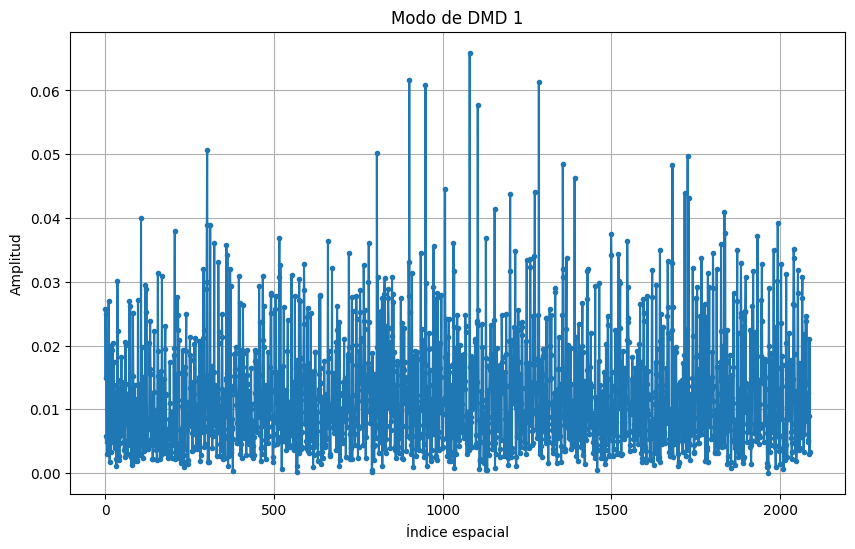

In [ ]:
# Visualización del primer modo de DMD
modo_a_plotear = 1 # Cambia esto para visualizar diferentes modos

plt.figure(figsize=(10, 6))
plt.plot(np.abs(Phi[:, modo_a_plotear]), '.-')  # Usamos valor absoluto para simplificar
plt.title(f'Modo de DMD {modo_a_plotear}')
plt.xlabel('Índice espacial')
plt.ylabel('Amplitud')
plt.grid(True)
plt.show()


C:\Users\danie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pydmd\snapshots.py:73: UserWarning:

Input data condition number 2884469232993687.0. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.

C:\Users\danie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pydmd\bopdmd.py:751: UserWarning:

Initial trial of Optimized DMD failed to converge. Consider re-adjusting your variable projection parameters with the varpro_opts_dict and consider setting verbose=True.



Frequencies (imaginary component): [-0.045+0.579j -0.045-0.579j -0.039+0.205j -0.039-0.205j]


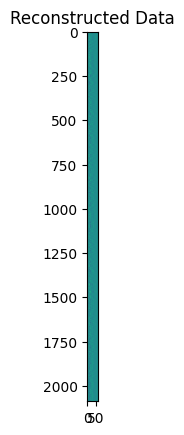

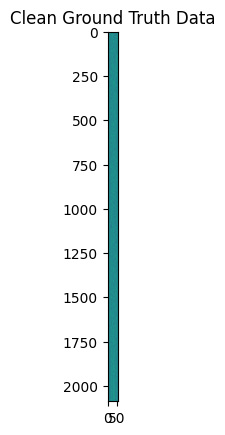

In [30]:

# Asegurarse de que no haya NaNs
temperature_df_clean = temp_regions.fillna(method='ffill').fillna(method='bfill')

# Convertir a numpy y transponer
data_matrix = temperature_df_clean.values.T

# Escalar los datos (opcional)

scaler = StandardScaler()
data_matrix_scaled = scaler.fit_transform(data_matrix)

# Aplicar DMD con un svd_rank ajustado
dmd = DMD(svd_rank=6)  # Ejemplo: Usar los 2 valores singulares principales
dmd.fit(data_matrix_scaled)
# Paso 3: Analizar los resultados
# Obtener modos dinámicos y valores propios (frecuencias)
modes = dmd.modes
eigenvalues = dmd.eigs
#plot_summary(dmd, x=x, t=dt, d=d)
# Intentar nuevamente visualizar los resultados
scaler = StandardScaler()

# Build the Optimized DMD model.
# num_trials=0 gives Optimized DMD, without bagging.
optdmd = BOPDMD(svd_rank=4, num_trials=0)
d = 2
t = np.arange(len(data_matrix_scaled))
# Asegurarse de que los datos también se ajusten a la nueva longitud del vector de tiempo
# Necesitamos "cortar" los datos para que coincidan con la longitud de 'delay_t'
# Esto se hace cortando las últimas 'd-1' columnas de 'data_matrix_scaled'
adjusted_data_matrix = data_matrix_scaled[:, :(len(data_matrix_scaled.T) - d + 1)]
# Wrap the model with the preprocessing routine.

delay_optdmd = hankel_preprocessing(optdmd, d=d)

# Fit the model to the noisy data.
# Note: BOPDMD models need the data X and the times of data collection t for fitting.
# Hence if we apply time-delay, we must adjust the length of our time vector accordingly.
delay_t = t[: -d + 1]
delay_optdmd.fit(adjusted_data_matrix.T, t=delay_t)
# Plot a summary of the DMD results.
#plot_summary(delay_optdmd, x=adjusted_data_matrix, d=d)

# Print computed eigenvalues (frequencies are given by imaginary components).
# Also plot the resulting data reconstruction.
print(
    f"Frequencies (imaginary component): {np.round(delay_optdmd.eigs, decimals=3)}"
)
plt.title("Reconstructed Data")
plt.imshow(delay_optdmd.reconstructed_data.real)
plt.show()

plt.title("Clean Ground Truth Data")
plt.imshow(adjusted_data_matrix.T)
plt.show()

,Region 0,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,...,Region 48,Region 49,Region 50,Region 51,Region 52,Region 53,Region 54,Region 55,Region 56,Region 57
time,,,,,,,,,,,,,,,,,,,,,
2000.041667,1.270163,1.543789,0.133258,2.082063,2.820716,0.645884,0.946331,-0.404698,-0.069944,-0.176103,...,-0.476241,0.278005,0.293492,0.607863,0.725420,0.560476,0.284217,0.303260,0.524520,0.406245
2000.125000,0.458428,4.031354,1.852183,1.755697,4.354782,1.904400,1.346441,-0.196098,-0.061854,-0.145436,...,-0.361143,0.401776,0.415589,0.738445,0.815428,0.314331,0.343181,0.186253,0.251190,0.465557
2000.208333,0.476010,3.272987,3.762984,1.471229,3.810826,2.689033,0.945404,-0.063415,-0.074519,-0.093643,...,-0.139407,0.482250,0.616174,0.617324,0.648514,0.274157,0.489707,0.272411,0.197080,0.456823
2000.291667,2.414918,0.391247,0.546937,2.233021,0.240749,0.143128,0.881529,0.012532,-0.088256,0.028836,...,0.009282,0.206908,0.468799,0.497436,0.665925,0.172246,-0.005994,0.231111,0.339869,0.348263
2000.375000,-0.408245,-1.044732,0.176612,1.341067,1.702635,1.110084,1.292494,0.048704,0.143404,-0.079999,...,-0.027526,-0.015121,0.490803,0.684174,0.338424,0.125253,0.346925,0.387388,0.377400,0.248589


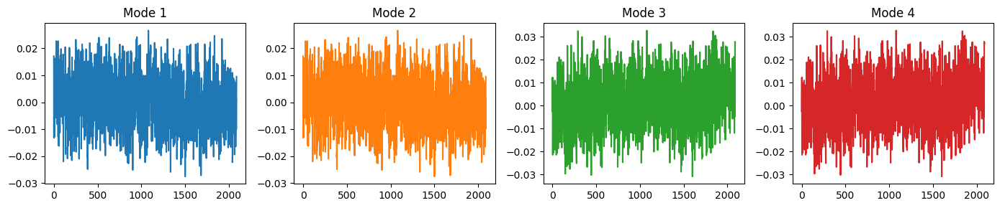

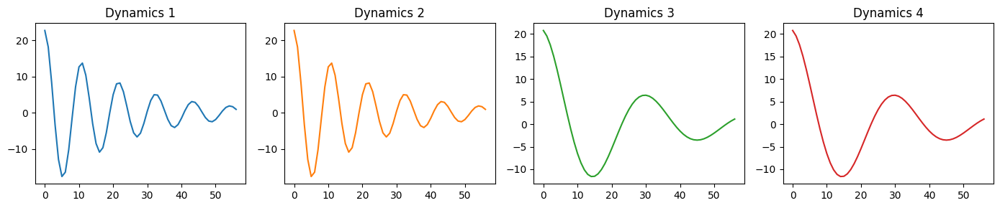

C:\Users\danie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pydmd\plotter.py:202: UserWarning:

Legend does not support handles for list instances.
A proxy artist may be used instead.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#controlling-the-legend-entries



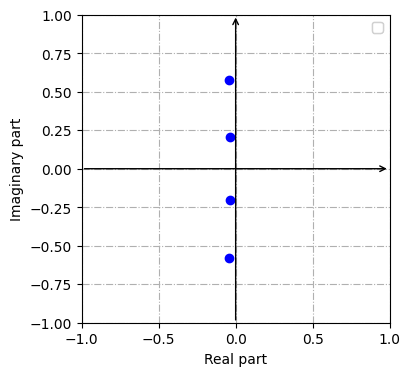

Computed amplitudes: [22.7   22.7   20.747 20.747]



In [ ]:
colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]

# Plotting the modes individually...
plt.figure(figsize=(14, 3))
for i, mode in enumerate(delay_optdmd.modes.T):
    # Get the average across delays, since we used time-delay.
    mode = np.average(mode.reshape(d, len(mode) // d), axis=0)
    plt.subplot(1, len(delay_optdmd.modes.T), i + 1)
    plt.plot(mode.real, c=colors[i])
    plt.title(f"Mode {i + 1}")
plt.tight_layout()
plt.show()

# Plotting the dynamics individually...
plt.figure(figsize=(14, 3))
for i, dynamic in enumerate(delay_optdmd.dynamics):
    plt.subplot(1, len(delay_optdmd.dynamics), i + 1)
    plt.plot(delay_t, dynamic.real, c=colors[i])
    plt.title(f"Dynamics {i + 1}")
plt.tight_layout()
plt.show()

# Plot the eigenvalues.
plot_eigs(delay_optdmd, show_axes=True, show_unit_circle=False, figsize=(4, 4))

# Print the amplitudes.
print(f"Computed amplitudes: {np.round(delay_optdmd.amplitudes, decimals=3)}\n")

C:\Users\danie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pydmd\snapshots.py:73: UserWarning:

Input data condition number 2240689663455013.5. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.

C:\Users\danie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pydmd\bopdmd.py:751: UserWarning:

Initial trial of Optimized DMD failed to converge. Consider re-adjusting your variable projection parameters with the varpro_opts_dict and consider setting verbose=True.



Frequencies (imaginary component): [ 0.02 +1.028j  0.02 -1.028j -0.002+0.149j -0.002-0.149j]


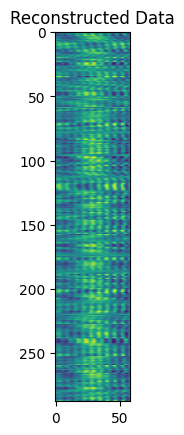

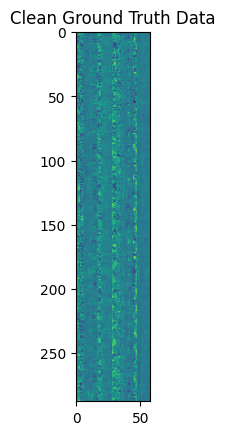

In [36]:

# Filtrar los datos para quedarnos solo con los mayores al año 2000
filtered_temperature_df = temperature_df_clean.loc[temperature_df_clean.index > 2000]



# Asegurarse de que no haya NaNs
temperature_df_clean = filtered_temperature_df.fillna(method='ffill').fillna(method='bfill')

# Convertir a numpy y transponer
data_matrix = temperature_df_clean.values.T

# Escalar los datos (opcional)

scaler = StandardScaler()
data_matrix_scaled = scaler.fit_transform(data_matrix)

# Aplicar DMD con un svd_rank ajustado
dmd = DMD(svd_rank=6)  # Ejemplo: Usar los 2 valores singulares principales
dmd.fit(data_matrix_scaled)
# Paso 3: Analizar los resultados
# Obtener modos dinámicos y valores propios (frecuencias)
modes = dmd.modes
eigenvalues = dmd.eigs
#plot_summary(dmd, x=x, t=dt, d=d)
# Intentar nuevamente visualizar los resultados
scaler = StandardScaler()

# Build the Optimized DMD model.
# num_trials=0 gives Optimized DMD, without bagging.
optdmd = BOPDMD(svd_rank=4, num_trials=0)
d = 2
t = np.arange(len(data_matrix_scaled))
# Asegurarse de que los datos también se ajusten a la nueva longitud del vector de tiempo
# Necesitamos "cortar" los datos para que coincidan con la longitud de 'delay_t'
# Esto se hace cortando las últimas 'd-1' columnas de 'data_matrix_scaled'
adjusted_data_matrix = data_matrix_scaled[:, :(len(data_matrix_scaled.T) - d + 1)]
# Wrap the model with the preprocessing routine.

delay_optdmd = hankel_preprocessing(optdmd, d=d)

# Fit the model to the noisy data.
# Note: BOPDMD models need the data X and the times of data collection t for fitting.
# Hence if we apply time-delay, we must adjust the length of our time vector accordingly.
delay_t = t[: -d + 1]
delay_optdmd.fit(adjusted_data_matrix.T, t=delay_t)
# Plot a summary of the DMD results.
#plot_summary(delay_optdmd, x=adjusted_data_matrix, d=d)

# Print computed eigenvalues (frequencies are given by imaginary components).
# Also plot the resulting data reconstruction.
print(
    f"Frequencies (imaginary component): {np.round(delay_optdmd.eigs, decimals=3)}"
)
plt.title("Reconstructed Data")
plt.imshow(delay_optdmd.reconstructed_data.real)
plt.show()

plt.title("Clean Ground Truth Data")
plt.imshow(adjusted_data_matrix.T)
plt.show()